In [1]:
import argparse
import random
import os
import cv2
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, roc_auc_score
from mlxtend.plotting import plot_confusion_matrix

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG19,VGG16
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
 
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)
print("GPU", "available (True)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.8.2
TF Hub version: 0.12.0
GPU available (True)


Mount and Import Dataset From Google Drive

In [2]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

root_dir = "/content/gdrive/My Drive/"
training_base_dir = root_dir + "/Colab Notebooks/Dataset1/Training/"
testing_base_dir = root_dir + "/Colab Notebooks/Dataset1/Testing/"

Mounted at /content/gdrive


Convert Image Path to List

In [3]:
train_image_path = paths.list_images(training_base_dir)
train_image_path = sorted(train_image_path)

test_image_path = paths.list_images(testing_base_dir)
test_image_path = sorted(test_image_path)

Add Image Path to List

In [4]:
data = []
labels = []

for trainPath in train_image_path:
    label = trainPath.split(os.path.sep)[-2]
    image = cv2.imread(trainPath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  
    image = cv2.resize(image, (224, 224))
    
    data.append(image)
    labels.append(label)

data = np.array(data) / 255.0
labels = np.array(labels)

In [5]:
lb = LabelBinarizer()
labels = lb.fit_transform(labels)
labels = to_categorical(labels)

Initialize Learning Rate, Epochs, Batch Size, and Data Augmentation

In [6]:
INIT_LearningRate = 0.001
Epochs = 100
Batch_Size = 4

(trainX, testX, trainY, testY) = train_test_split(data, labels,
    test_size=0.20, stratify=labels, random_state=42)

train_datagen = ImageDataGenerator(rotation_range = 15, fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1./255)
test_generator = test_datagen.flow_from_directory(testing_base_dir,
    target_size = (224, 224),
    color_mode = 'rgb',
    batch_size = 2,seed=42,
    class_mode="categorical",
    shuffle = False)

# Add CNN architecture VGG16
build_model = VGG16(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))

Found 300 images belonging to 2 classes.
58900480/58889256 [==============================] - 1s 0us/step


Create CNN Model

In [7]:
# create model
CNN_model = build_model.output
CNN_model = AveragePooling2D(pool_size=(4, 4))(CNN_model)
CNN_model = Flatten(name="flatten")(CNN_model)
CNN_model = Dense(64, activation="relu")(CNN_model)
CNN_model = Dropout(0.5)(CNN_model)
CNN_model = Dense(2, activation="softmax")(CNN_model)

model = Model(inputs=build_model.input, outputs=CNN_model)

for layer in build_model.layers:
    layer.trainable = False

# compile our model
print("Compiling CNN model...")
Optimize = Adam(lr=INIT_LearningRate, decay=INIT_LearningRate / Epochs)
model.compile(loss="binary_crossentropy", optimizer=Optimize, metrics=["accuracy"])

# model summary
model.summary()

Compiling CNN model...
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                 
 block4_conv2 (Conv2D)       (None, 28, 28, 512)       2359808   
                                                                 
 block4_conv3 (Conv2D)       (None, 28, 28, 512)       2359808   
                                                                 
 block4_pool (MaxPooling2D)  (None, 14, 14, 512)       0         
                                                                 
 block5_conv1 (Conv2D)       (None, 14, 14, 512)       2359808   
                                                                 
 block5_conv2 (Conv2D)       (None, 14, 14, 512)       2359808   
                                                                 
 block5_conv3 (Conv2D)       (None, 14, 14, 512)       2359808   
                                                                 
 block5_pool (MaxPooling2D)  (None, 7, 7, 512)         0         
                                                                 
 average_p

Training Model CNN

In [8]:
print("Training CNN model...")
Train = model.fit(
    train_datagen.flow(trainX, trainY, batch_size=Batch_Size),
    steps_per_epoch=len(trainX) // Batch_Size,
    validation_data=(testX, testY),
    validation_steps=len(testX) // Batch_Size,
    epochs=Epochs)

Training CNN model...
Epoch 1/100
300/300 [==============================] - 30s 57ms/step - loss: 0.5094 - accuracy: 0.7675 - val_loss: 0.3781 - val_accuracy: 0.8467
Epoch 2/100
300/300 [==============================] - 17s 56ms/step - loss: 0.3772 - accuracy: 0.8525 - val_loss: 0.3272 - val_accuracy: 0.8767
Epoch 3/100
300/300 [==============================] - 18s 59ms/step - loss: 0.3330 - accuracy: 0.8733 - val_loss: 0.2956 - val_accuracy: 0.8833
Epoch 4/100
300/300 [==============================] - 18s 60ms/step - loss: 0.3015 - accuracy: 0.8792 - val_loss: 0.2780 - val_accuracy: 0.8867
Epoch 5/100
300/300 [==============================] - 19s 62ms/step - loss: 0.2958 - accuracy: 0.8917 - val_loss: 0.2591 - val_accuracy: 0.9067
Epoch 6/100
300/300 [==============================] - 18s 59ms/step - loss: 0.2844 - accuracy: 0.8883 - val_loss: 0.2517 - val_accuracy: 0.9100
Epoch 7/100
300/300 [==============================] - 18s 59ms/step - loss: 0.2746 - accuracy: 0.8883 - val

Initialize auth with GDrive

In [9]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive 
from google.colab import auth 
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()                       
drive = GoogleDrive(gauth)

Save model to Google Drive

In [10]:
model.save('model_covid-19.h5')
model_file = drive.CreateFile({'title' : 'model_covid-19.h5'})
model_file.SetContentFile('model_covid-19.h5')
model_file.Upload()

Visualization model training

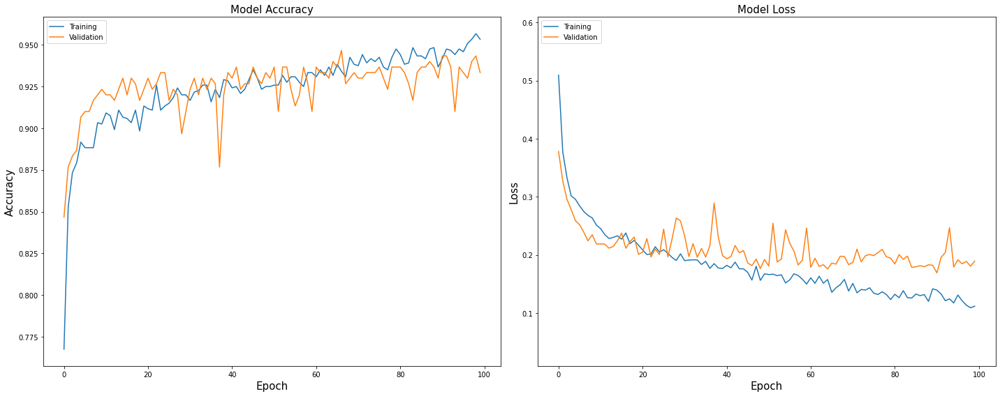

In [11]:
xlabel = 'Epoch'
legends = ['Training', 'Validation']

ylim_pad = [0.01, 0.1]
plt.figure(figsize=(20, 8))

# Plot training & validation Accuracy values
y1 = Train.history['accuracy']
y2 = Train.history['val_accuracy']

min_y = min(min(y1), min(y2))-ylim_pad[0]
max_y = max(max(y1), max(y2))+ylim_pad[0]

plt.subplot(121)
plt.plot(y1)
plt.plot(y2)
plt.title('Model Accuracy', fontsize=15)
plt.xlabel(xlabel, fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
plt.ylim(min_y, max_y)
plt.legend(legends, loc='upper left')
plt.tight_layout()  
                         
# Plot training & validation loss values
y1 = Train.history['loss']
y2 = Train.history['val_loss']

min_y = min(min(y1), min(y2))-ylim_pad[1]
max_y = max(max(y1), max(y2))+ylim_pad[1]
    
plt.subplot(122)
plt.plot(y1)
plt.plot(y2)
plt.title('Model Loss', fontsize=15)
plt.xlabel(xlabel, fontsize=15)
plt.ylabel('Loss', fontsize=15)
plt.ylim(min_y, max_y)
plt.legend(legends, loc='upper left')

plt.tight_layout()                  
plt.show()

Evaluate Model

In [13]:
print("results evaluate model")
result  = model.evaluate(test_generator, steps=len(test_generator), verbose=1)
print("%s%.2f  "% ("Loss     : ", result[0]))
print("%s%.2f%s"% ("Accuracy : ", result[1]*100, "%"))

results evaluate model
150/150 [==============================] - 78s 512ms/step - loss: 0.2161 - accuracy: 0.9233
Loss     : 0.22  
Accuracy : 92.33%


Confusion Matrix

150/150 - 4s - 4s/epoch - 26ms/step
Result Confusion Matrix
------------------------------------------------------------------------------------------
Accuracy:  92.33333333333333 %
Precision:  92.33521489843993 %
Recall:  92.33333333333333 %
f1:  92.33324814720163 %


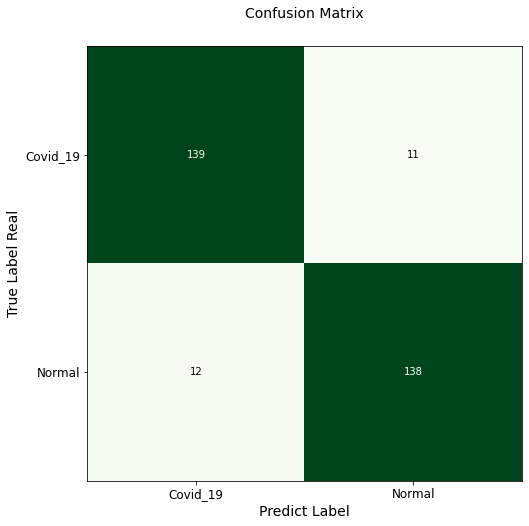

Sensitivity: 92.67%
Specificity: 92.00%


              precision    recall  f1-score   support

    Covid_19       0.92      0.93      0.92       150
      Normal       0.93      0.92      0.92       150

    accuracy                           0.92       300
   macro avg       0.92      0.92      0.92       300
weighted avg       0.92      0.92      0.92       300



In [14]:
# evaluate the model
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,confusion_matrix
y_true = test_generator.classes
predictions = model.predict(test_generator, steps=len(test_generator), verbose=2)
predicted_classes = np.argmax(predictions,axis=1)

def scores(y_true,y_pred):
  accuracy = accuracy_score(y_true,y_pred)
  precision = precision_score(y_true,y_pred,average='macro')
  recall = recall_score(y_true,y_pred,average='macro')
  f1 = f1_score(y_true,y_pred,average='macro')
  confusionmatrix = confusion_matrix(y_true, y_pred)
  print("="*90)
  print("Result Confusion Matrix")
  print("-"*90)
  print("Accuracy: ", accuracy*100, "%")
  print("Precision: ", precision*100, "%")
  print("Recall: ", recall*100, "%")
  print("f1: ", f1*100, "%")
  print("="*90)
  fig, ax = plot_confusion_matrix(conf_mat=confusionmatrix ,  figsize=(10,8), hide_ticks=True,cmap=plt.cm.Greens)
  plt.xticks(range(len(lb.classes_)), lb.classes_, fontsize=12)
  plt.yticks(range(len(lb.classes_)), lb.classes_, fontsize=12)
  plt.title("Confusion Matrix", fontsize=14)
  plt.ylabel('True Label Real',fontsize=14)
  plt.xlabel('Predict Label',fontsize=14)
  plt.show()

  cls_report_print = classification_report(y_true, y_pred, target_names=lb.classes_)
  cls_report = classification_report(y_true, y_pred, target_names=lb.classes_, output_dict=True)
  total1=sum(sum(confusionmatrix))

  ##### From confusion matrix calculate accuracy
  print("="*90)
  sensitivity1 = confusionmatrix[0,0]/(confusionmatrix[0,0]+confusionmatrix[0,1])
  print("%s%.2f%s"% ("Sensitivity: ", sensitivity1*100, "%"))
  specificity1 = confusionmatrix[1,1]/(confusionmatrix[1,0]+confusionmatrix[1,1])
  print("%s%.2f%s"% ("Specificity: ", specificity1*100, "%"))

  print("\n")
  print("="*90)
  print("="*90)
  print(cls_report_print)
  print("="*90)

scores(y_true,predicted_classes)

Initialize model for predictions dataset testing and visualization

In [15]:
preds = model.predict(test_generator,steps=1000,verbose=2)

1000/1000 - 3s - 3s/epoch - 3ms/step


Predictions finished
Output Predictions From Data Testing : 


probability:[9.9997091e-01 2.9058185e-05]


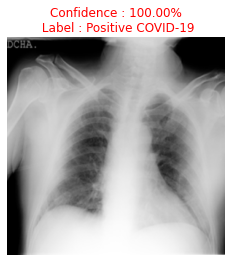



probability:[0.92850417 0.07149581]


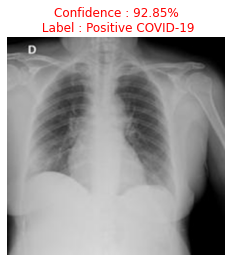



probability:[9.9950945e-01 4.9051968e-04]


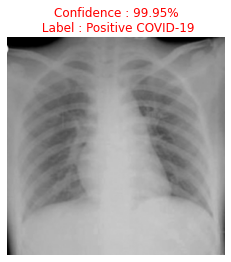



probability:[9.9999988e-01 1.1502788e-07]


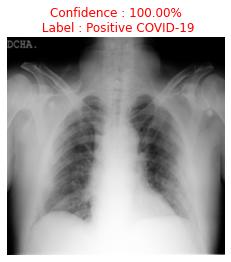



probability:[0.9721943  0.02780565]


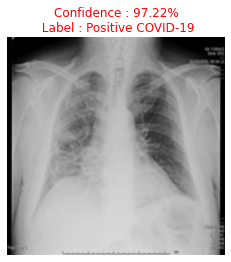



probability:[1.0000000e+00 1.3847205e-08]


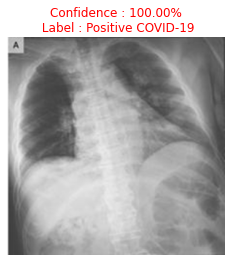



probability:[9.999999e-01 8.744044e-08]


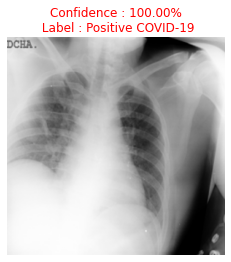



probability:[1.00000e+00 6.45818e-10]


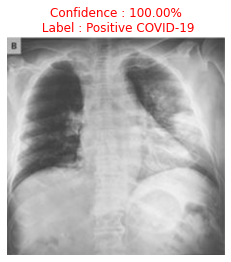



probability:[1.000000e+00 8.767855e-09]


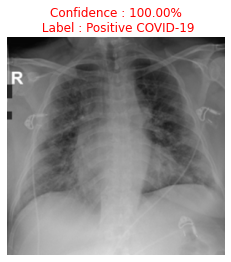



probability:[1.0000000e+00 1.3077914e-10]


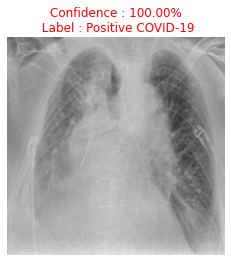



probability:[1.0000000e+00 5.3798715e-12]


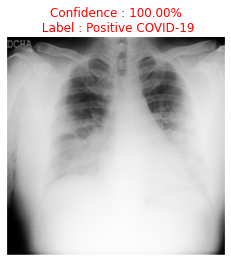



probability:[1.000000e+00 8.583091e-14]


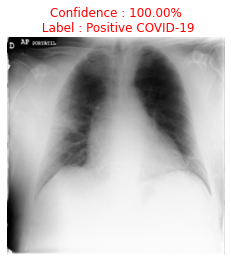



probability:[0.99413776 0.00586223]


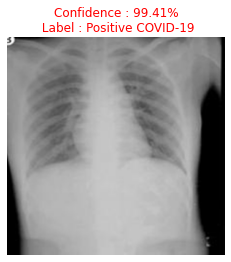



probability:[9.999920e-01 7.942741e-06]


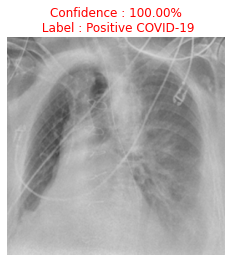



probability:[9.9999833e-01 1.6281632e-06]


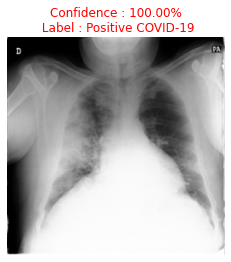



probability:[9.9999952e-01 4.6878324e-07]


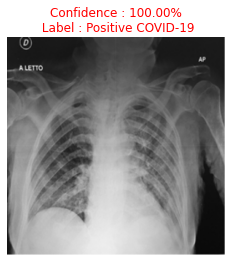



probability:[9.99999881e-01 1.11286475e-07]


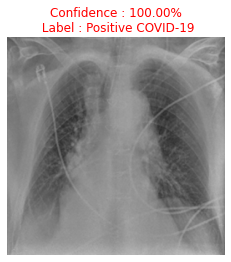



probability:[9.9994802e-01 5.2026142e-05]


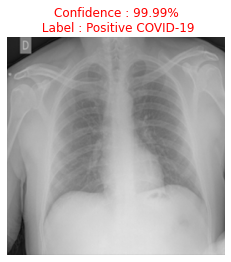



probability:[1.0000000e+00 1.2618705e-08]


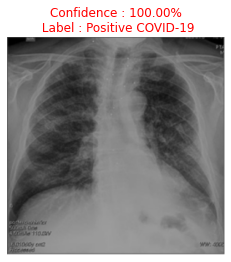



probability:[1.0000000e+00 4.3814897e-18]


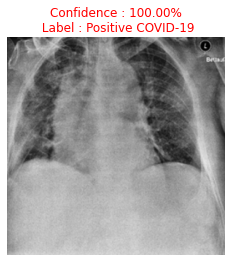



probability:[0.9973152  0.00268471]


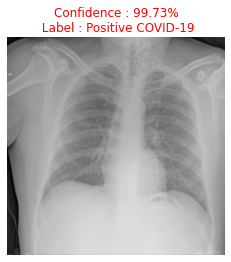



probability:[1.0000000e+00 2.0002455e-11]


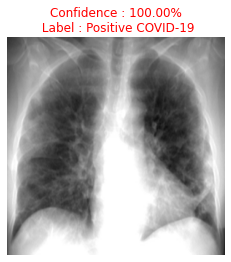



probability:[1.0000000e+00 2.4336217e-09]


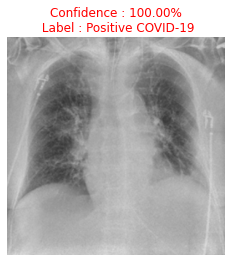



probability:[0.98642504 0.01357495]


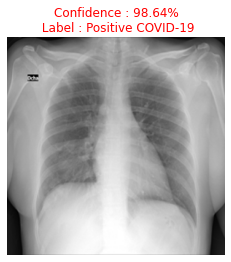



probability:[1.0000000e+00 4.0977053e-15]


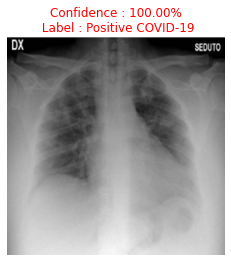



probability:[0.9802198  0.01978026]


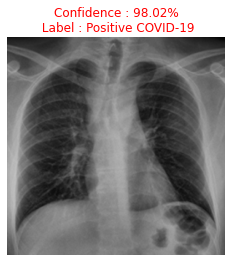



probability:[0.762351  0.2376491]


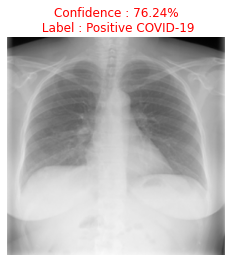



probability:[1.000000e+00 7.857888e-11]


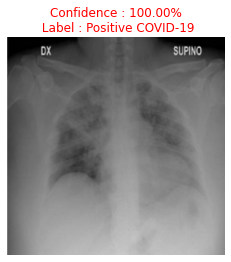



probability:[9.999999e-01 1.640320e-07]


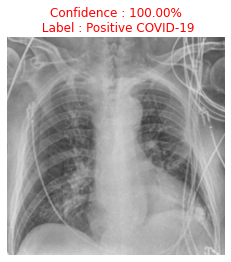



probability:[0.6888722  0.31112778]


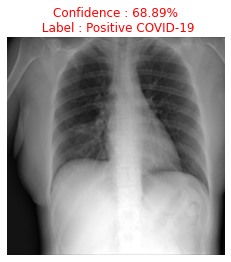



probability:[1.0000000e+00 1.7737636e-10]


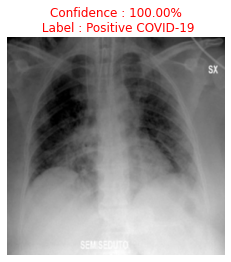



probability:[1.0000000e+00 6.5939776e-10]


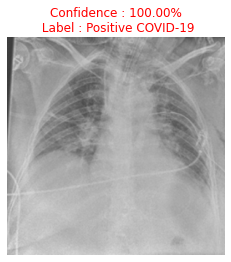



probability:[9.999999e-01 7.673646e-08]


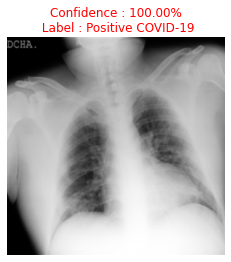



probability:[0.27414876 0.7258513 ]


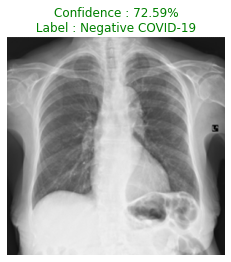



probability:[9.999927e-01 7.318513e-06]


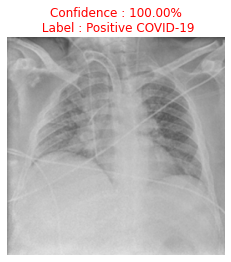



probability:[9.9987113e-01 1.2887077e-04]


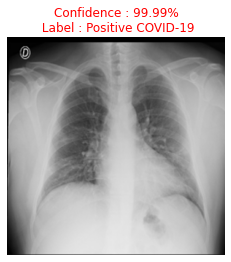



probability:[0.8606383  0.13936165]


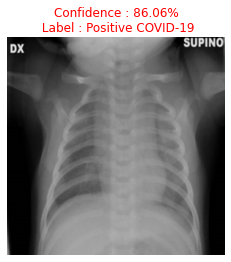



probability:[1.0000000e+00 1.7530642e-11]


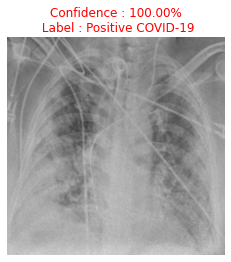



probability:[1.0000000e+00 5.0448825e-14]


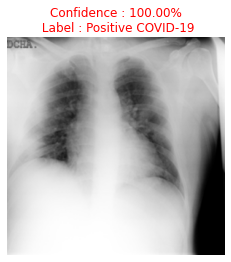



probability:[0.5516855 0.4483145]


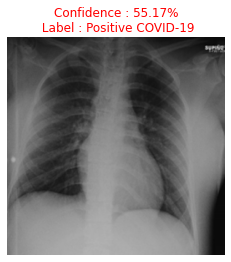



probability:[0.9904268  0.00957317]


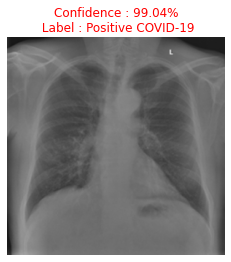



probability:[9.9999964e-01 3.2307125e-07]


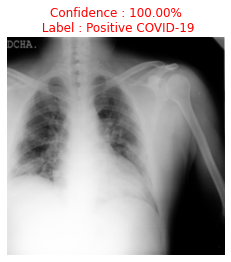



probability:[0.27677226 0.72322774]


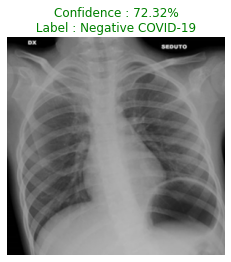



probability:[9.9994290e-01 5.7043148e-05]


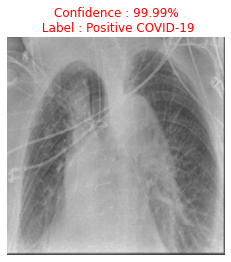



probability:[9.9998581e-01 1.4206163e-05]


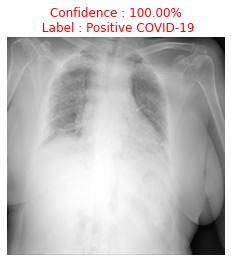



probability:[0.6708951 0.3291049]


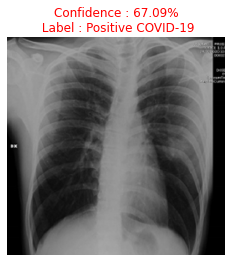



probability:[9.9954683e-01 4.5313992e-04]


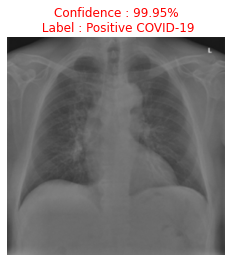



probability:[9.9963582e-01 3.6422495e-04]


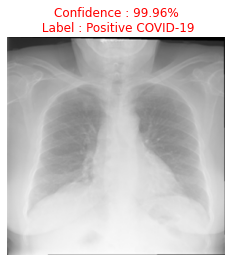



probability:[1.000000e+00 8.237363e-12]


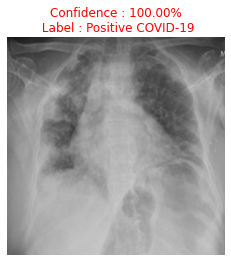



probability:[0.99815696 0.00184299]


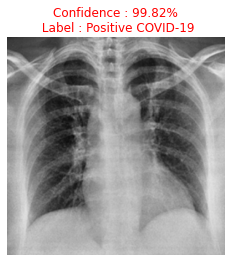



probability:[1.0000000e+00 3.5783376e-08]


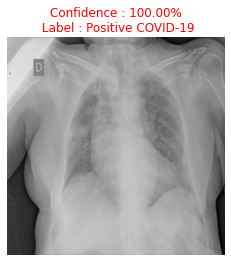



probability:[1.000000e+00 3.450109e-10]


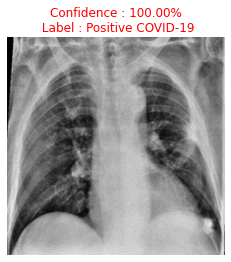



probability:[9.9993515e-01 6.4846980e-05]


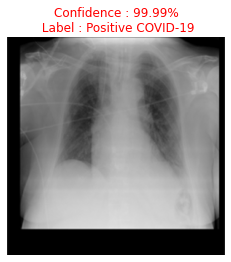



probability:[0.99722785 0.00277209]


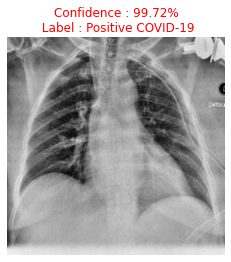



probability:[1.00000000e+00 1.26795765e-08]


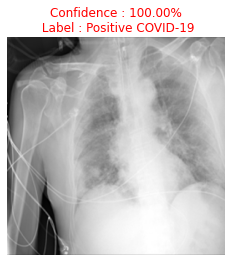



probability:[9.9999690e-01 3.1588831e-06]


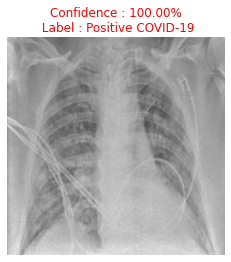



probability:[0.99861777 0.00138227]


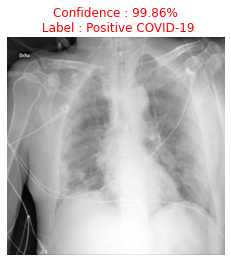



probability:[0.99455667 0.00544337]


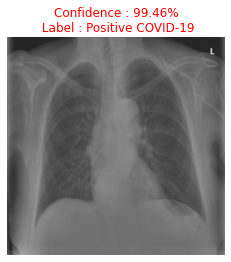



probability:[9.9995935e-01 4.0698189e-05]


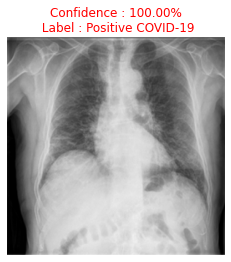



probability:[1.000000e+00 2.185417e-08]


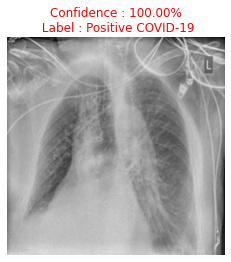



probability:[0.9986833 0.0013167]


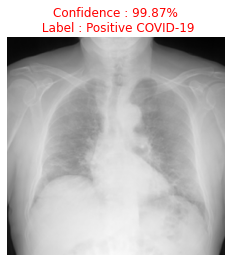



probability:[9.9999321e-01 6.8041495e-06]


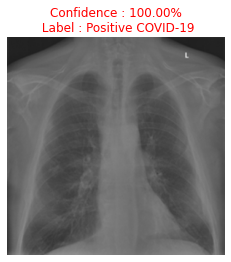



probability:[1.0000000e+00 6.4559296e-09]


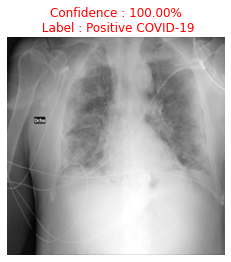



probability:[1.000000e+00 8.087207e-13]


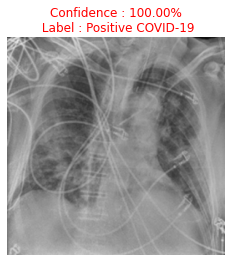



probability:[9.9999964e-01 3.0343193e-07]


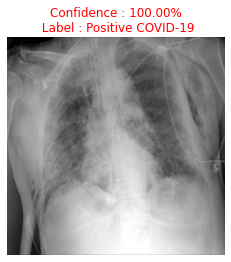



probability:[1.0000000e+00 2.9108605e-08]


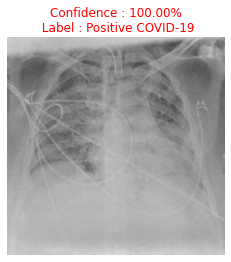



probability:[9.9986243e-01 1.3754785e-04]


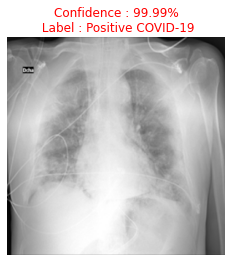



probability:[1.0000000e+00 1.0562596e-10]


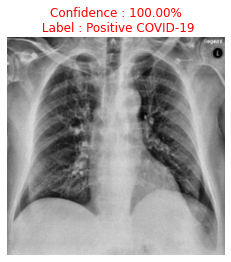



probability:[1.000000e+00 3.522857e-10]


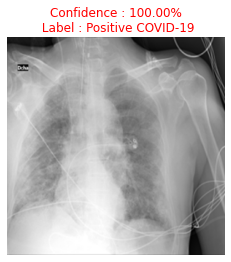



probability:[1.0000000e+00 1.0697153e-11]


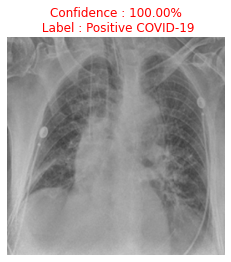



probability:[1.0000000e+00 1.4604843e-09]


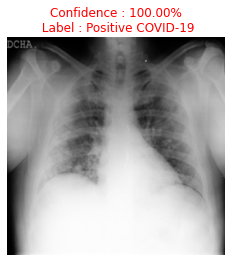



probability:[9.999920e-01 7.986005e-06]


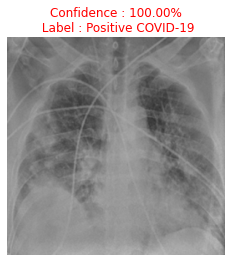



probability:[1.0000000e+00 1.1975954e-10]


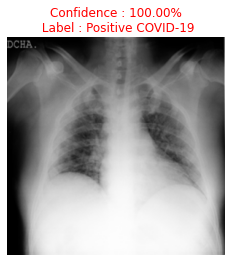



probability:[1.0000000e+00 1.6598083e-08]


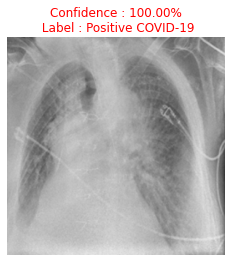



probability:[0.00768474 0.9923153 ]


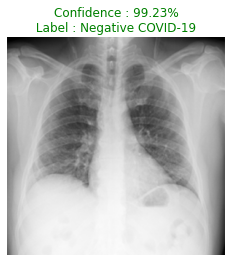



probability:[9.9999976e-01 1.9434059e-07]


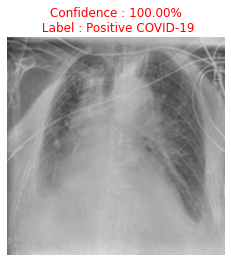



probability:[9.9999964e-01 3.3472892e-07]


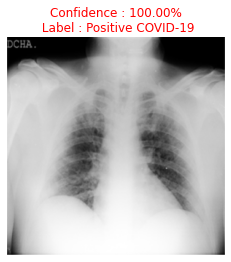



probability:[9.9999952e-01 5.2272463e-07]


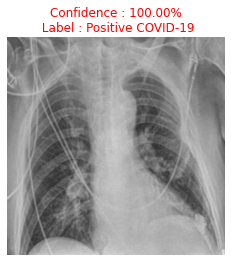



probability:[1.0000000e+00 1.0496026e-09]


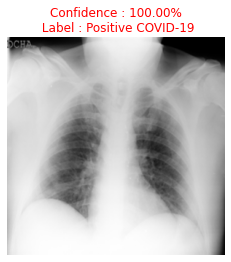



probability:[0.7418118 0.2581882]


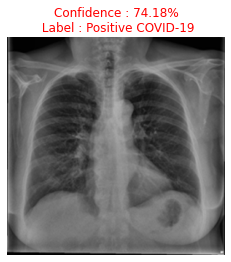



probability:[0.99708766 0.0029124 ]


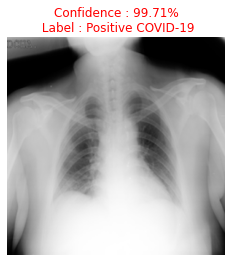



probability:[1.0000000e+00 4.7960445e-14]


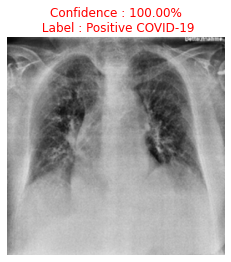



probability:[0.57024527 0.42975467]


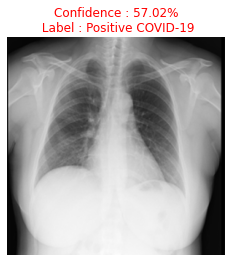



probability:[0.99693716 0.00306285]


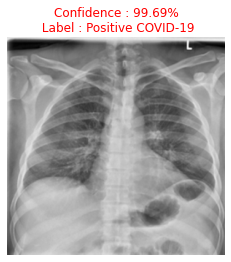



probability:[9.9986875e-01 1.3123699e-04]


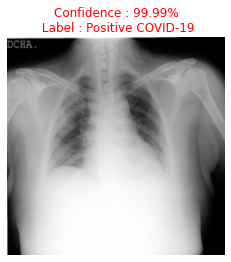



probability:[1.0000000e+00 2.7146077e-08]


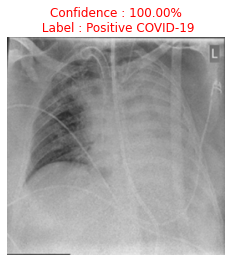



probability:[9.9999106e-01 8.9046307e-06]


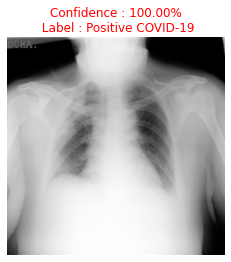



probability:[9.9900633e-01 9.9363446e-04]


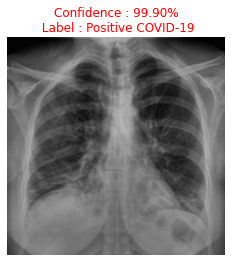



probability:[9.999926e-01 7.431961e-06]


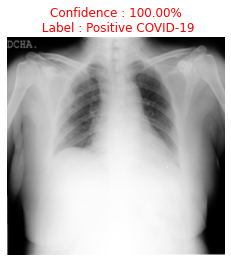



probability:[1.0000000e+00 2.2862055e-10]


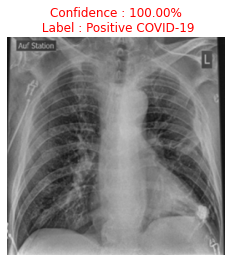



probability:[9.9999976e-01 2.4238054e-07]


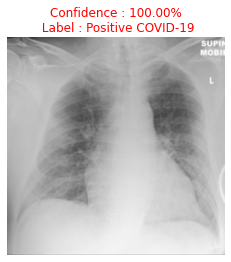



probability:[9.9988484e-01 1.1515992e-04]


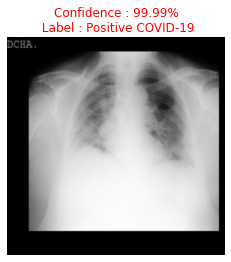



probability:[1.0000000e+00 1.5138522e-15]


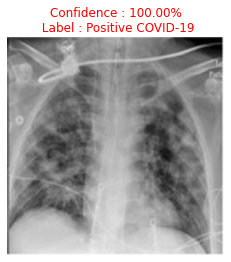



probability:[0.9658205  0.03417952]


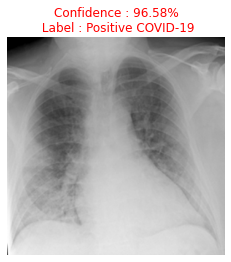



probability:[9.9999213e-01 7.9107049e-06]


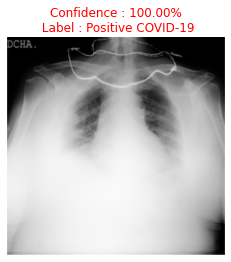



probability:[1.000000e+00 2.145877e-18]


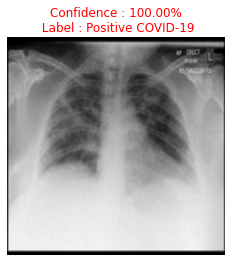



probability:[1.0000000e+00 6.5339365e-09]


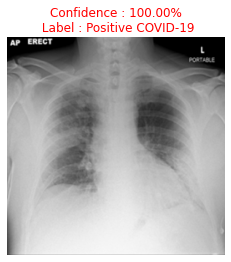



probability:[1.000000e+00 7.861212e-12]


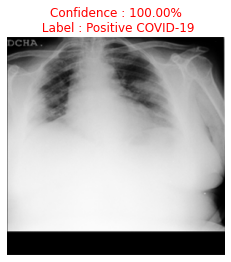



probability:[1.0000000e+00 2.0620891e-17]


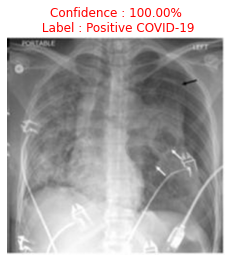



probability:[0.9845318  0.01546822]


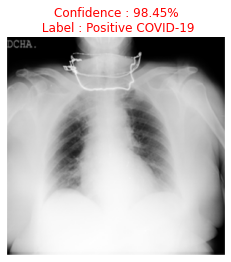



probability:[0.998992   0.00100791]


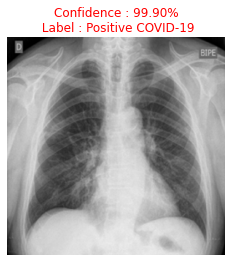



probability:[0.9237944  0.07620566]


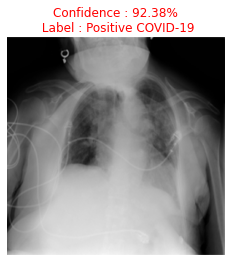



probability:[0.9953666  0.00463342]


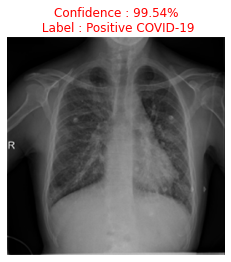



probability:[0.90380836 0.09619164]


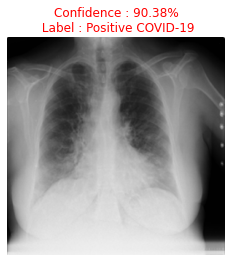



probability:[0.34487557 0.6551244 ]


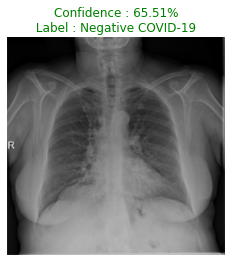



probability:[0.98944235 0.0105577 ]


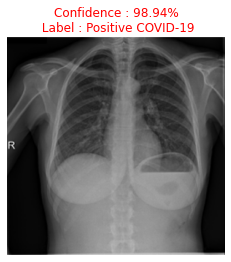



probability:[0.9186055  0.08139452]


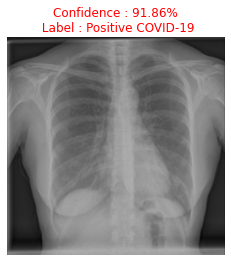



probability:[9.9929047e-01 7.0953520e-04]


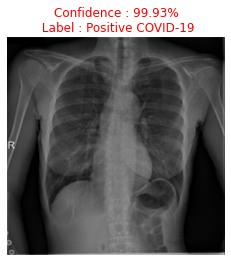



probability:[0.96581215 0.03418779]


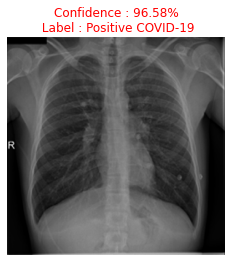



probability:[9.9998844e-01 1.1617010e-05]


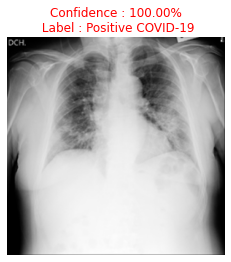



probability:[9.9999869e-01 1.2979925e-06]


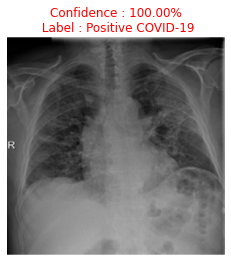



probability:[0.19487236 0.8051276 ]


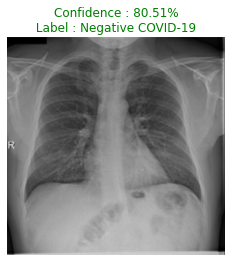



probability:[0.96563196 0.03436807]


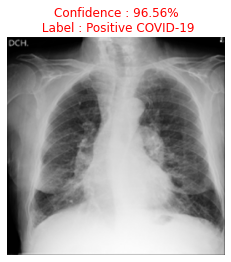



probability:[0.99773103 0.00226894]


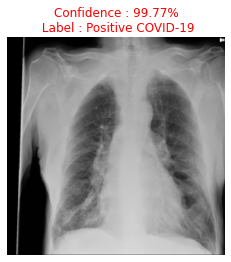



probability:[9.9961132e-01 3.8873628e-04]


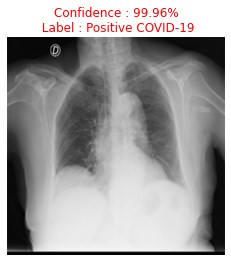



probability:[0.9110855  0.08891455]


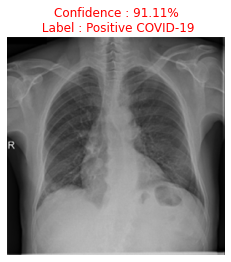



probability:[0.9947212  0.00527884]


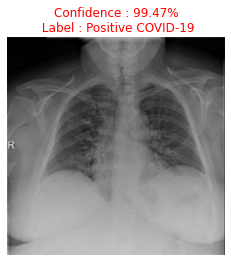



probability:[0.74969023 0.25030974]


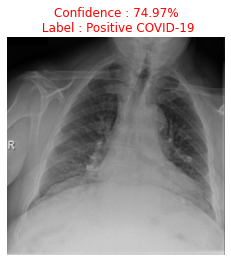



probability:[0.44027862 0.55972135]


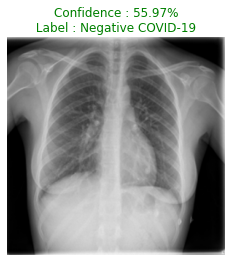



probability:[0.9804664 0.0195336]


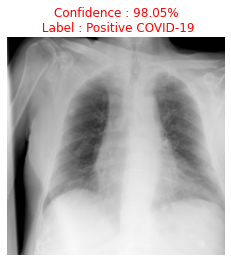



probability:[0.9962126  0.00378748]


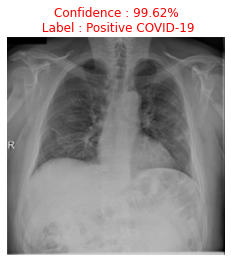



probability:[1.000000e+00 6.634141e-11]


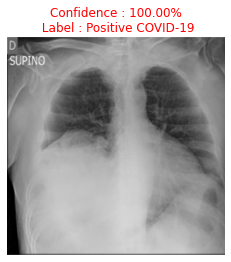



probability:[0.8125526  0.18744741]


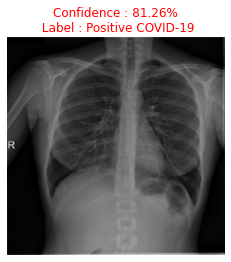



probability:[0.696203 0.303797]


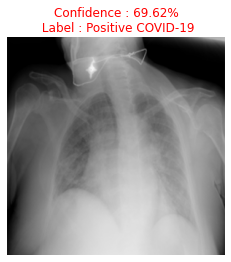



probability:[9.9937278e-01 6.2718836e-04]


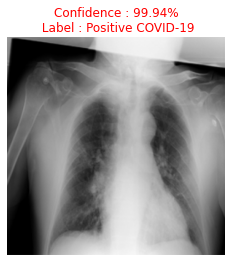



probability:[0.48033157 0.5196684 ]


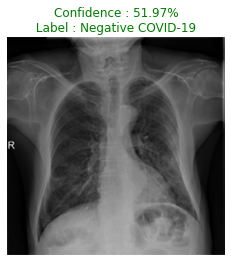



probability:[0.51131934 0.4886807 ]


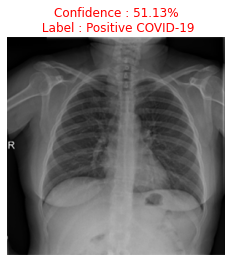



probability:[0.92680186 0.07319813]


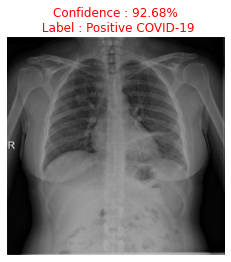



probability:[0.9503333  0.04966677]


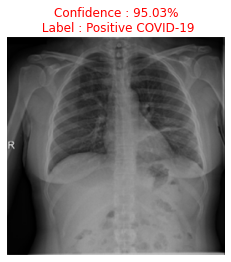



probability:[0.03906753 0.9609325 ]


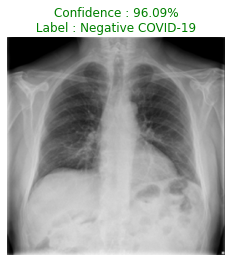



probability:[0.8170091  0.18299095]


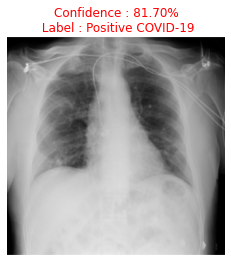



probability:[0.8170091  0.18299095]


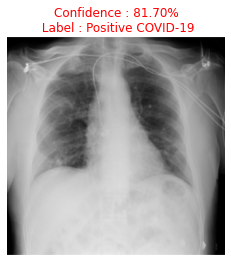



probability:[0.00362136 0.9963786 ]


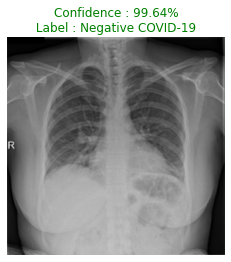



probability:[0.17804268 0.82195735]


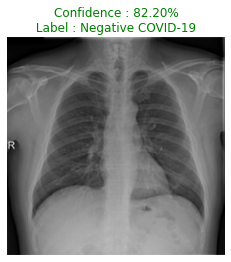



probability:[0.93563545 0.06436452]


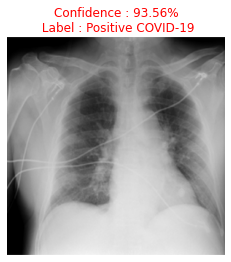



probability:[0.99875367 0.00124637]


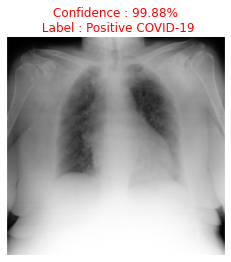



probability:[0.23437676 0.7656233 ]


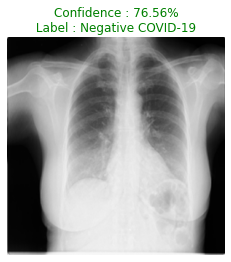



probability:[9.9973959e-01 2.6038647e-04]


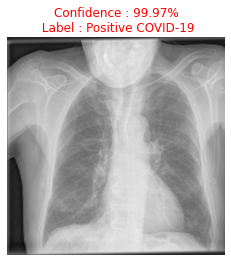



probability:[9.9999225e-01 7.7891609e-06]


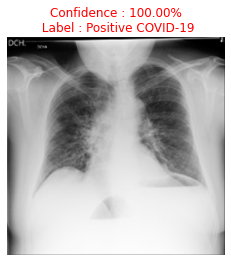



probability:[0.9970265  0.00297354]


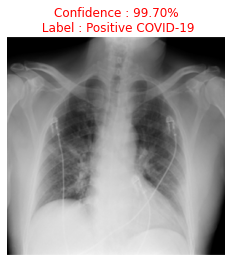



probability:[1.0000000e+00 1.5153802e-08]


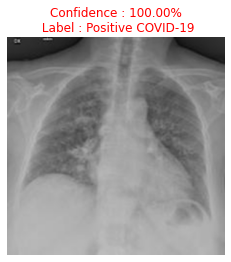



probability:[1.0000000e+00 1.4483016e-08]


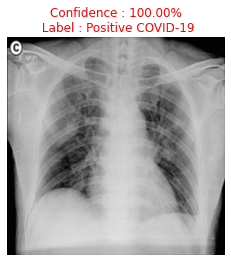



probability:[0.99285513 0.00714483]


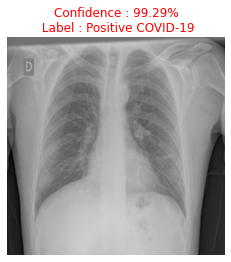



probability:[9.9999881e-01 1.2205858e-06]


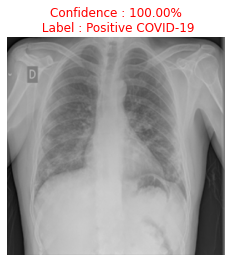



probability:[0.56888014 0.43111986]


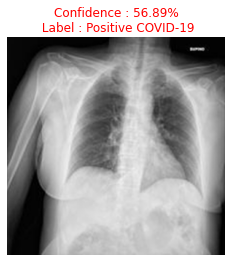



probability:[1.0000000e+00 2.3053188e-14]


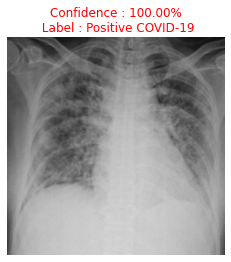



probability:[9.9997997e-01 1.9985335e-05]


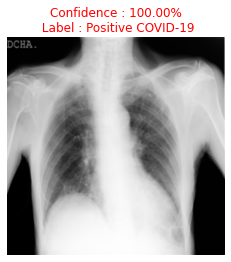



probability:[1.0000000e+00 7.1989595e-18]


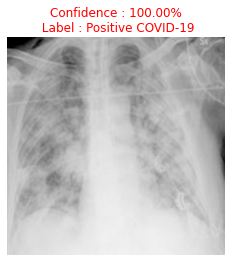



probability:[1.0000000e+00 1.2379825e-09]


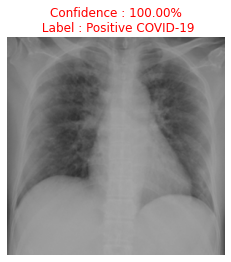



probability:[9.9999785e-01 2.0885893e-06]


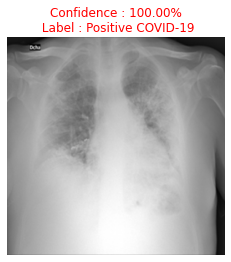



probability:[2.7726278e-13 1.0000000e+00]


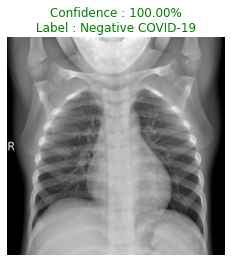



probability:[1.2801662e-08 1.0000000e+00]


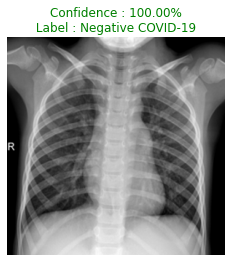



probability:[4.46426e-11 1.00000e+00]


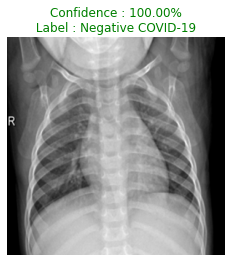



probability:[1.4597414e-12 1.0000000e+00]


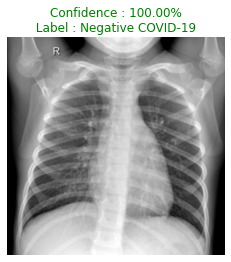



probability:[9.1453806e-08 9.9999988e-01]


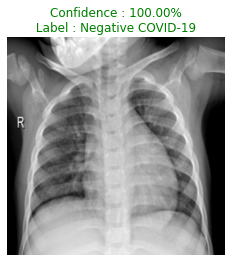



probability:[0.93097657 0.06902347]


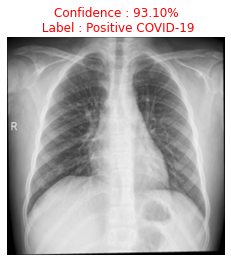



probability:[6.329481e-07 9.999994e-01]


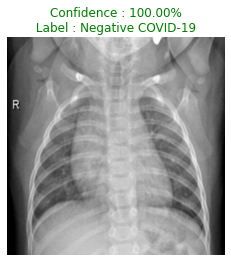



probability:[1.1056295e-14 1.0000000e+00]


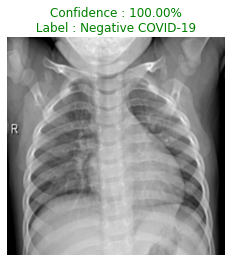



probability:[2.1917014e-10 1.0000000e+00]


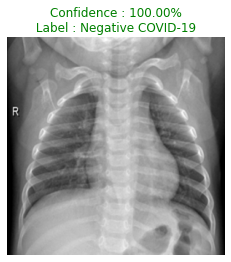



probability:[8.907168e-13 1.000000e+00]


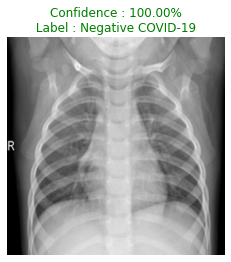



probability:[7.6238287e-11 1.0000000e+00]


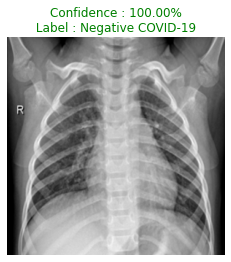



probability:[7.4322704e-10 1.0000000e+00]


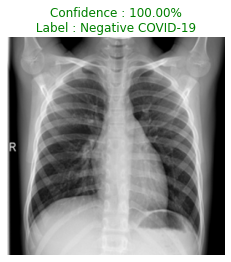



probability:[2.0383256e-07 9.9999976e-01]


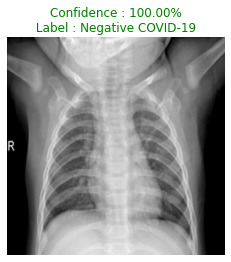



probability:[1.5857146e-18 1.0000000e+00]


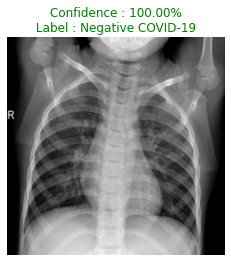



probability:[2.2167958e-04 9.9977833e-01]


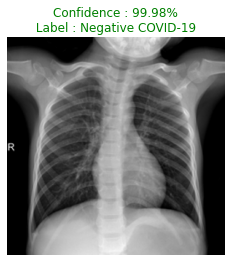



probability:[2.885024e-13 1.000000e+00]


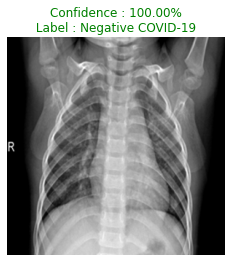



probability:[8.9170557e-04 9.9910825e-01]


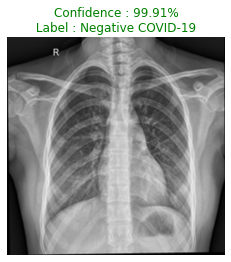



probability:[4.051986e-17 1.000000e+00]


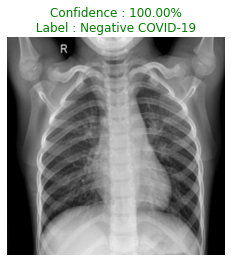



probability:[3.924413e-10 1.000000e+00]


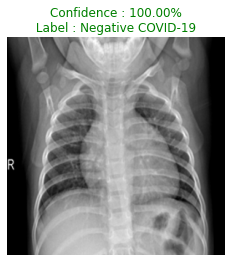



probability:[1.2196625e-07 9.9999988e-01]


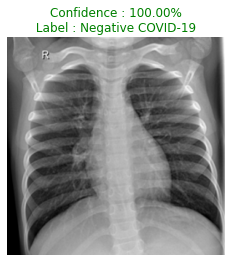



probability:[3.489373e-14 1.000000e+00]


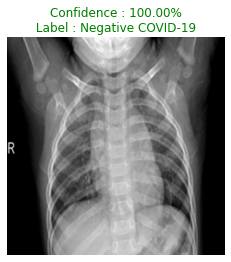



probability:[1.6663793e-10 1.0000000e+00]


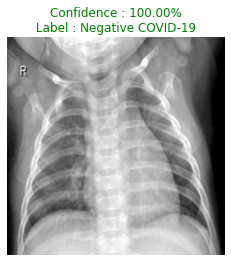



probability:[7.911681e-15 1.000000e+00]


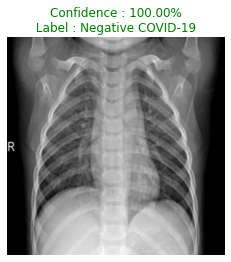



probability:[3.1603405e-24 1.0000000e+00]


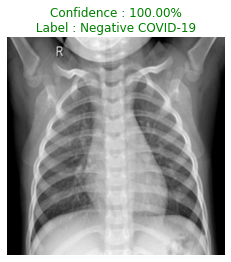



probability:[2.1423582e-06 9.9999785e-01]


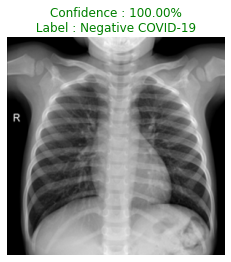



probability:[1.90387e-11 1.00000e+00]


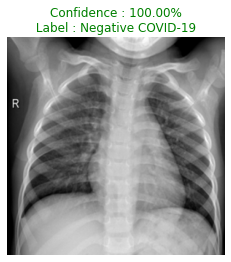



probability:[3.2653467e-13 1.0000000e+00]


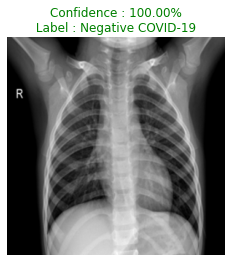



probability:[3.097286e-10 1.000000e+00]


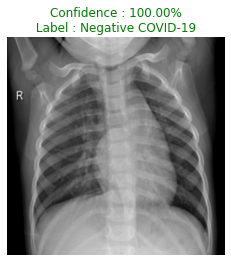



probability:[5.517588e-08 1.000000e+00]


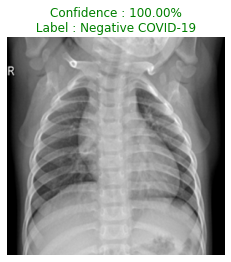



probability:[2.2258228e-12 1.0000000e+00]


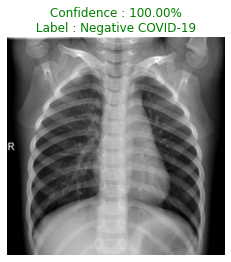



probability:[1.36862616e-17 1.00000000e+00]


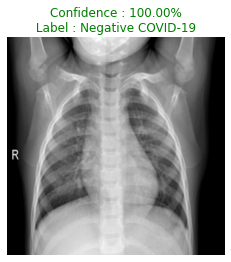



probability:[5.6901056e-20 1.0000000e+00]


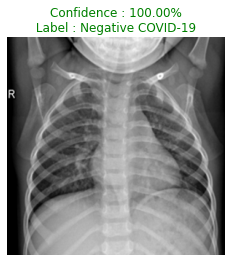



probability:[5.564521e-04 9.994436e-01]


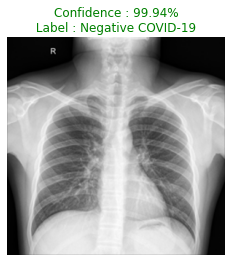



probability:[1.2781892e-07 9.9999988e-01]


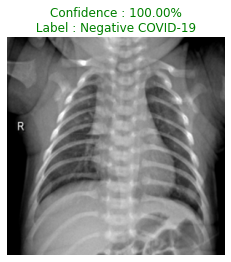



probability:[1.15686845e-07 9.99999881e-01]


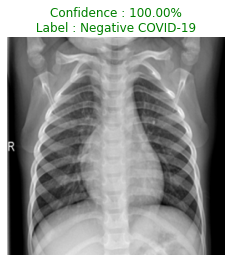



probability:[2.2933737e-09 1.0000000e+00]


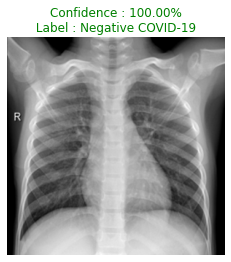



probability:[5.5719003e-05 9.9994433e-01]


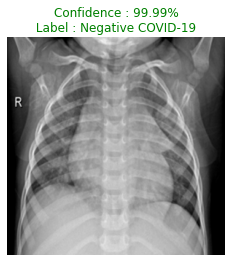



probability:[5.1868313e-13 1.0000000e+00]


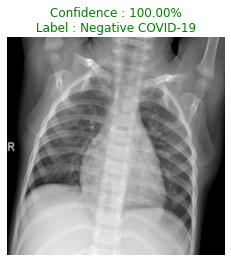



probability:[8.798074e-17 1.000000e+00]


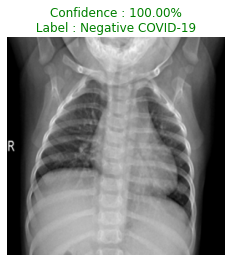



probability:[3.283374e-11 1.000000e+00]


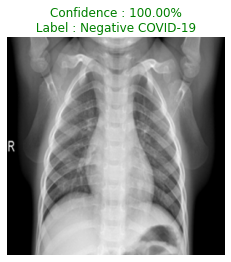



probability:[1.7139926e-16 1.0000000e+00]


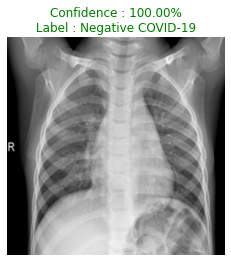



probability:[1.3520456e-07 9.9999988e-01]


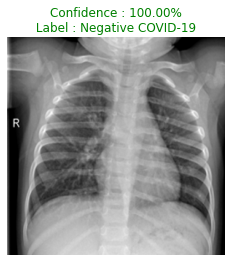



probability:[7.8811564e-14 1.0000000e+00]


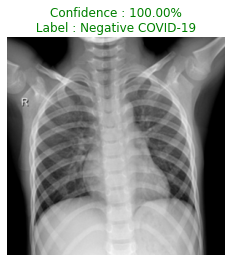



probability:[3.4728976e-07 9.9999964e-01]


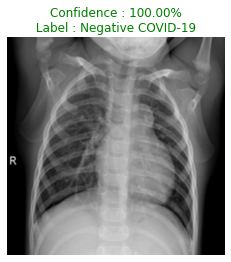



probability:[1.0435531e-11 1.0000000e+00]


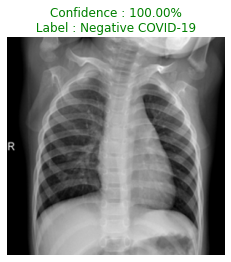



probability:[8.040066e-17 1.000000e+00]


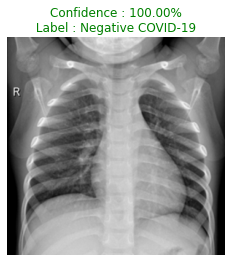



probability:[6.797387e-15 1.000000e+00]


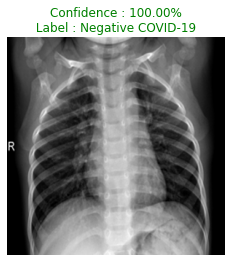



probability:[4.263792e-19 1.000000e+00]


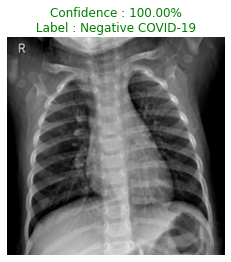



probability:[8.520639e-13 1.000000e+00]


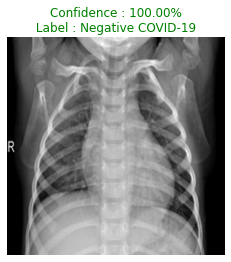



probability:[1.1198825e-08 1.0000000e+00]


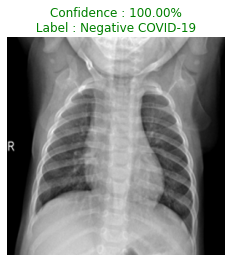



probability:[4.4770673e-11 1.0000000e+00]


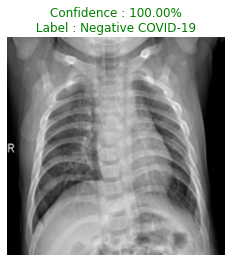



probability:[5.7866434e-11 1.0000000e+00]


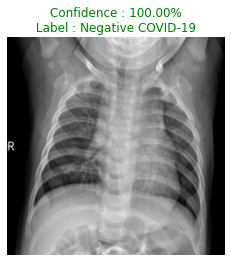



probability:[4.5024755e-11 1.0000000e+00]


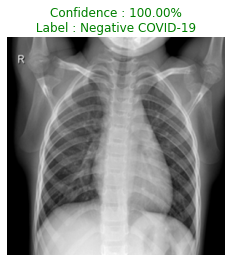



probability:[1.2225544e-16 1.0000000e+00]


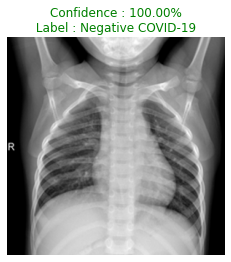



probability:[4.8185687e-12 1.0000000e+00]


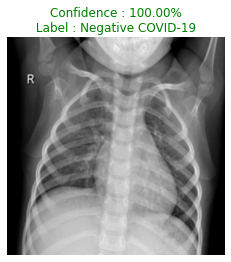



probability:[1.0759024e-12 1.0000000e+00]


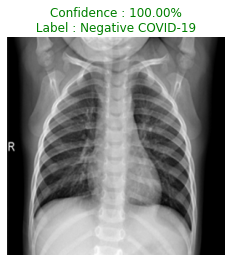



probability:[6.882716e-13 1.000000e+00]


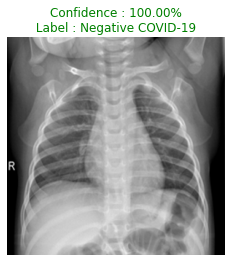



probability:[2.3737232e-23 1.0000000e+00]


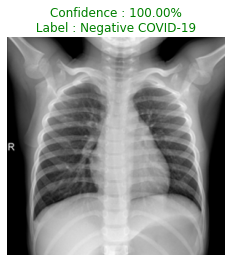



probability:[7.19742e-11 1.00000e+00]


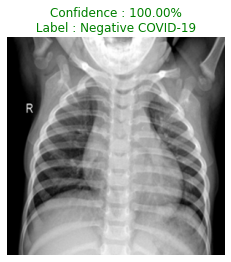



probability:[7.4270054e-07 9.9999928e-01]


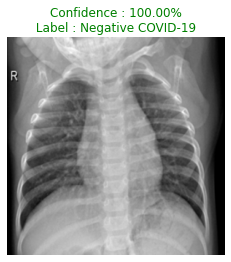



probability:[3.1119382e-16 1.0000000e+00]


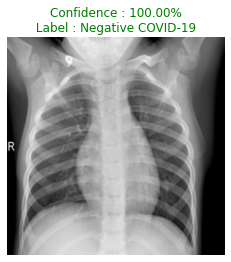



probability:[0.86221176 0.13778827]


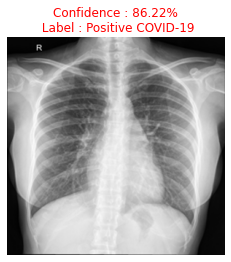



probability:[1.275506e-12 1.000000e+00]


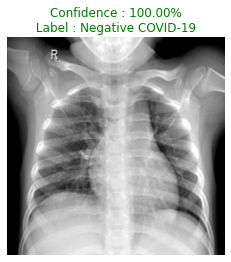



probability:[6.6596784e-10 1.0000000e+00]


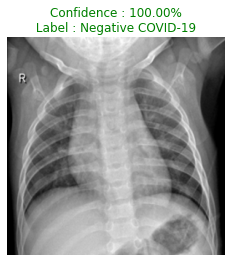



probability:[1.9978215e-06 9.9999797e-01]


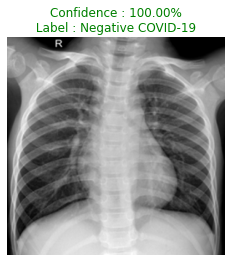



probability:[1.319433e-16 1.000000e+00]


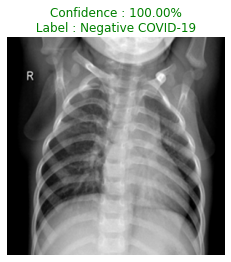



probability:[0.28123906 0.71876097]


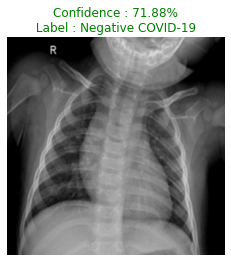



probability:[0.00232397 0.9976761 ]


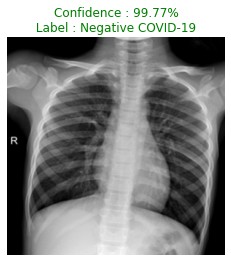



probability:[3.857396e-12 1.000000e+00]


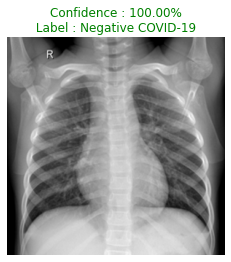



probability:[1.6485242e-10 1.0000000e+00]


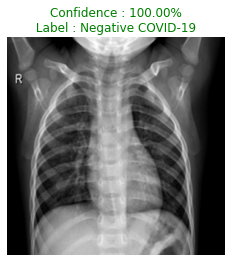



probability:[1.3298572e-09 1.0000000e+00]


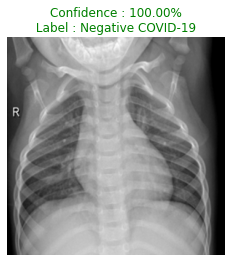



probability:[4.044213e-12 1.000000e+00]


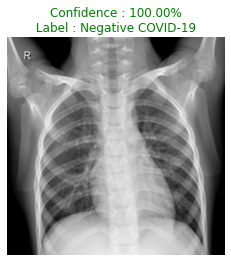



probability:[1.4065904e-09 1.0000000e+00]


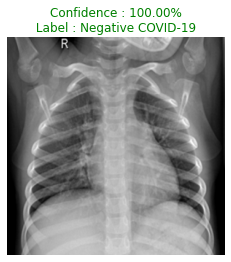



probability:[6.543053e-13 1.000000e+00]


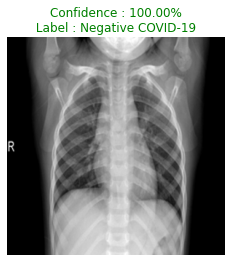



probability:[4.6086947e-11 1.0000000e+00]


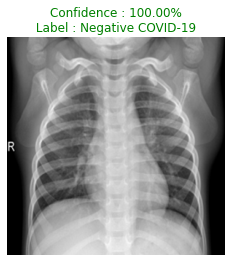



probability:[8.994848e-14 1.000000e+00]


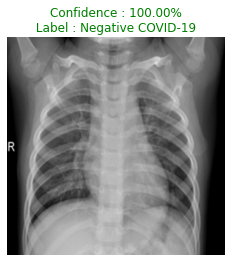



probability:[9.433609e-21 1.000000e+00]


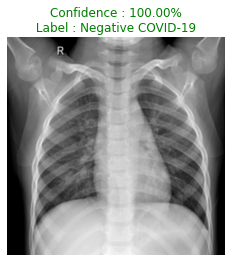



probability:[1.3638108e-09 1.0000000e+00]


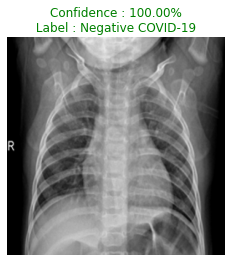



probability:[1.7904288e-14 1.0000000e+00]


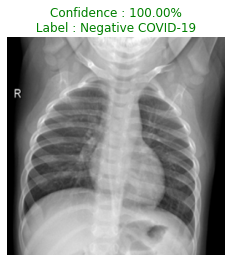



probability:[1.7276236e-12 1.0000000e+00]


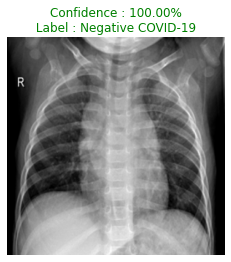



probability:[0.0010034  0.99899656]


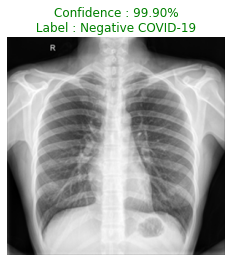



probability:[6.5825324e-13 1.0000000e+00]


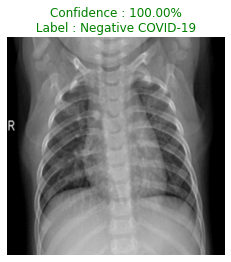



probability:[3.6560126e-12 1.0000000e+00]


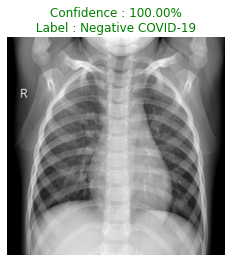



probability:[2.8547822e-12 1.0000000e+00]


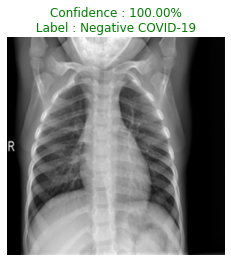



probability:[8.012943e-08 9.999999e-01]


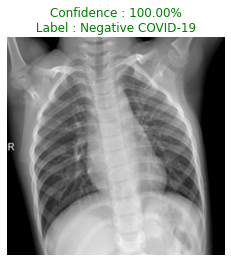



probability:[7.806685e-09 1.000000e+00]


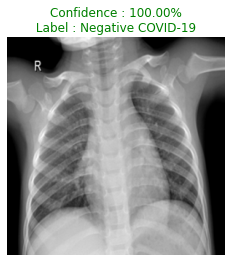



probability:[1.1141412e-11 1.0000000e+00]


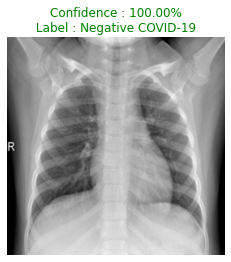



probability:[1.1023936e-09 1.0000000e+00]


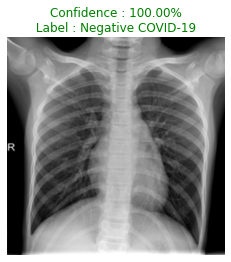



probability:[1.6896164e-08 1.0000000e+00]


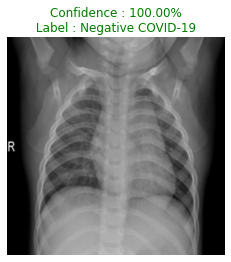



probability:[2.7336797e-17 1.0000000e+00]


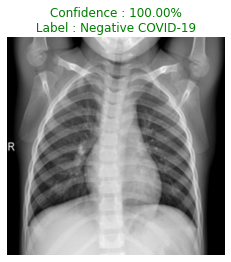



probability:[2.5950384e-16 1.0000000e+00]


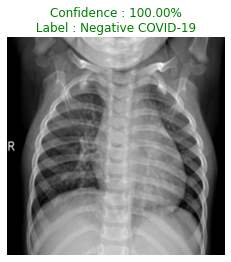



probability:[1.1127882e-15 1.0000000e+00]


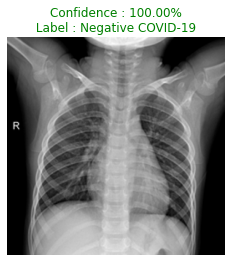



probability:[3.3218263e-17 1.0000000e+00]


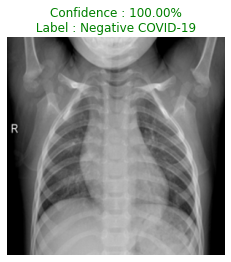



probability:[9.6221e-12 1.0000e+00]


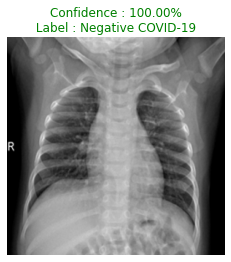



probability:[1.3839242e-14 1.0000000e+00]


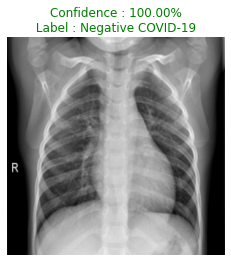



probability:[1.7717059e-12 1.0000000e+00]


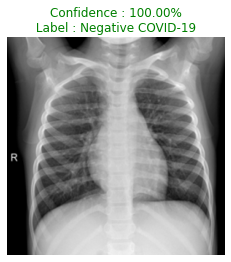



probability:[0.0538433 0.9461567]


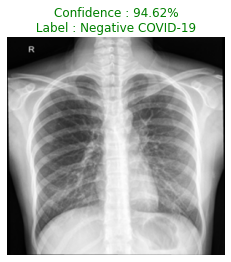



probability:[1.8581908e-09 1.0000000e+00]


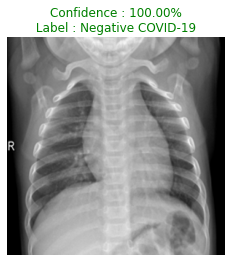



probability:[7.7800939e-07 9.9999917e-01]


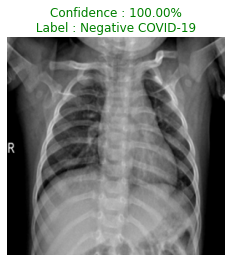



probability:[1.7339725e-15 1.0000000e+00]


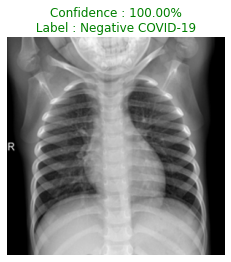



probability:[3.1607922e-13 1.0000000e+00]


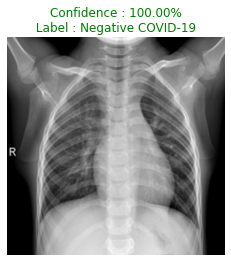



probability:[6.324047e-05 9.999367e-01]


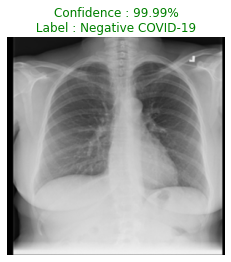



probability:[5.8613445e-08 1.0000000e+00]


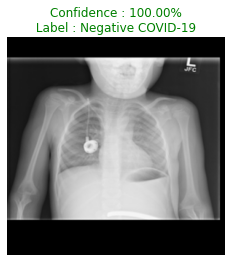



probability:[0.5653719 0.4346281]


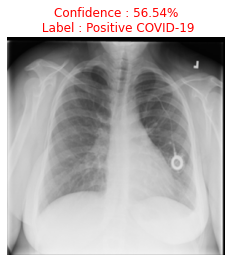



probability:[0.01915313 0.98084694]


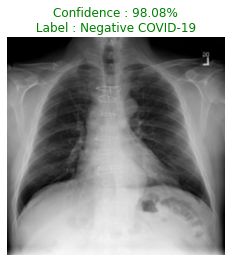



probability:[6.9709575e-05 9.9993026e-01]


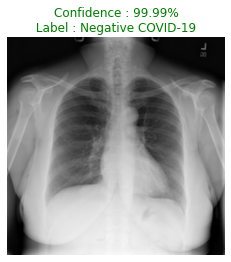



probability:[1.0000000e+00 1.6339998e-09]


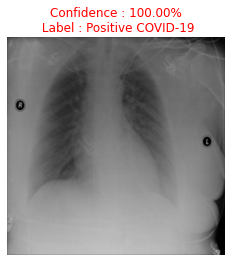



probability:[1.0871224e-04 9.9989128e-01]


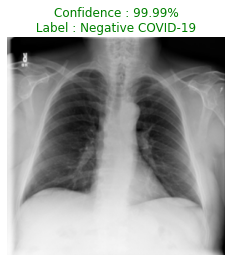



probability:[0.04148354 0.9585164 ]


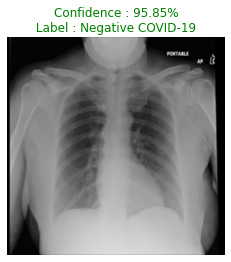



probability:[0.99576026 0.0042398 ]


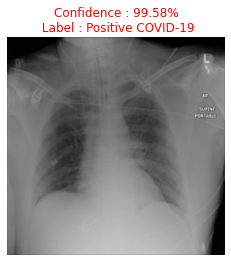



probability:[0.0498871  0.95011294]


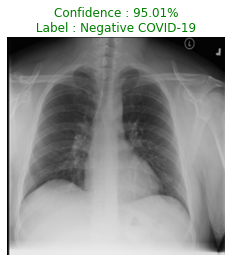



probability:[0.723852   0.27614796]


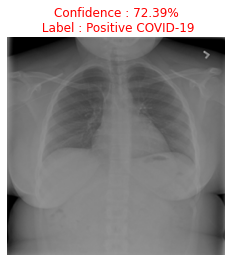



probability:[0.04007468 0.95992535]


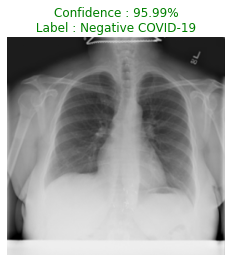



probability:[0.00882176 0.9911782 ]


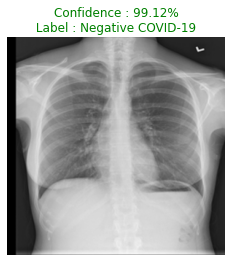



probability:[2.348325e-05 9.999765e-01]


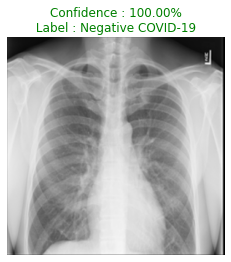



probability:[0.31661102 0.683389  ]


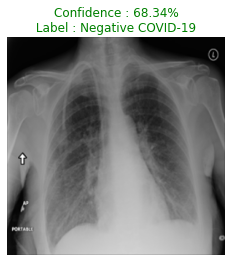



probability:[0.05656564 0.94343436]


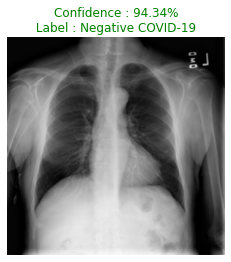



probability:[0.10168166 0.89831835]


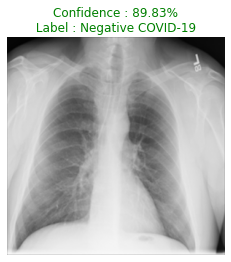



probability:[0.33231053 0.66768944]


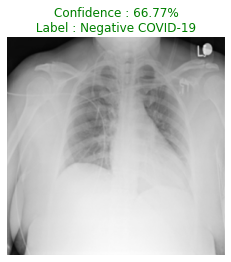



probability:[2.0738502e-05 9.9997926e-01]


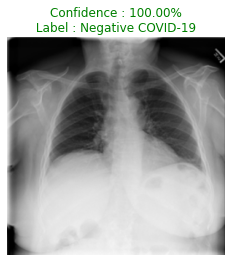



probability:[9.9999344e-01 6.5561303e-06]


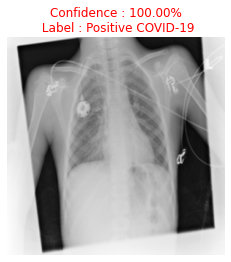



probability:[0.46574885 0.5342511 ]


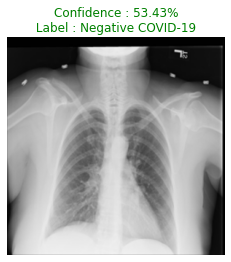



probability:[0.00370066 0.9962993 ]


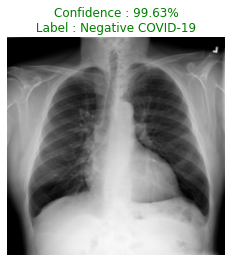



probability:[4.0442723e-05 9.9995959e-01]


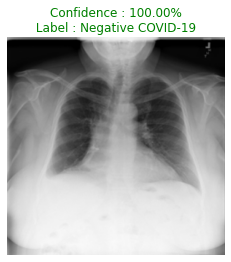



probability:[0.5051211  0.49487886]


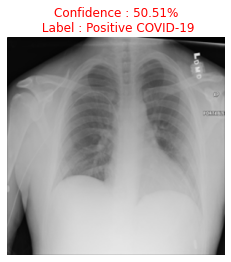



probability:[0.27399737 0.7260027 ]


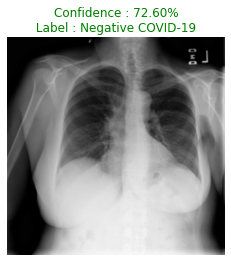



probability:[3.1991524e-04 9.9968004e-01]


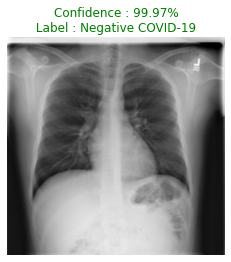



probability:[0.02942576 0.9705742 ]


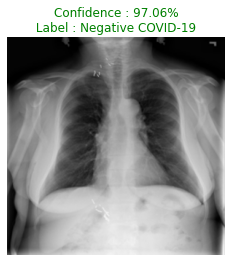



probability:[1.1018859e-07 9.9999988e-01]


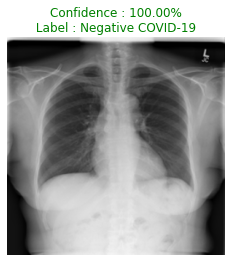



probability:[7.469382e-07 9.999993e-01]


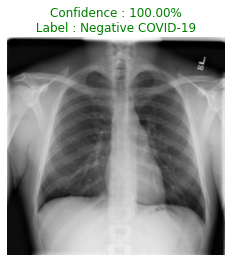



probability:[0.8131105  0.18688948]


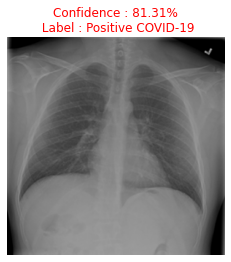



probability:[0.53866875 0.46133125]


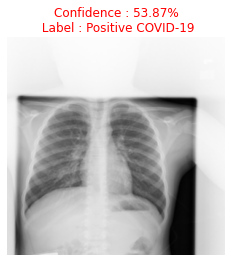



probability:[0.06935176 0.9306482 ]


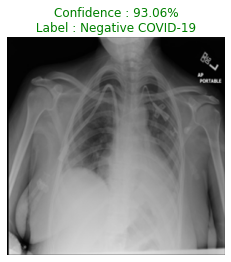



probability:[0.00222337 0.99777657]


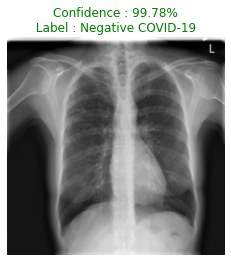



probability:[0.54739934 0.4526007 ]


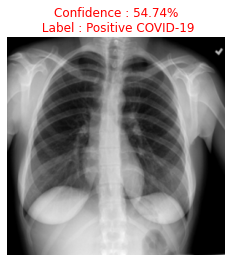



probability:[0.01170678 0.98829323]


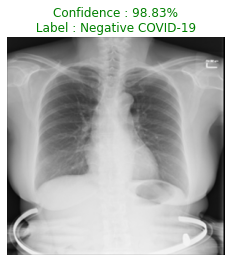



probability:[0.15446027 0.8455397 ]


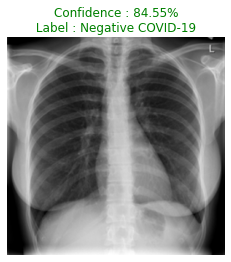



probability:[0.46577275 0.53422725]


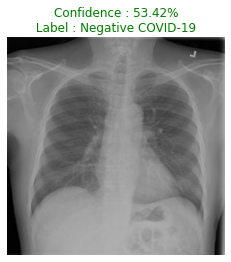



probability:[9.999279e-01 7.214645e-05]


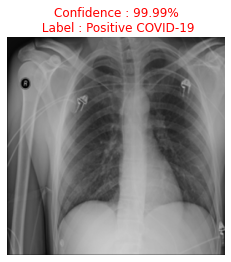



probability:[1.0664451e-06 9.9999893e-01]


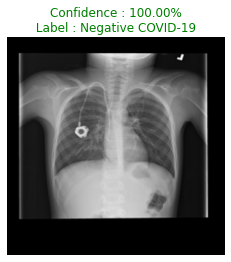



probability:[0.2426077 0.7573923]


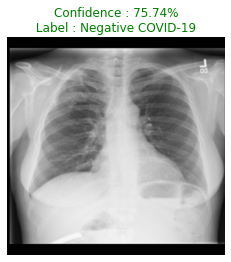



probability:[7.397265e-22 1.000000e+00]


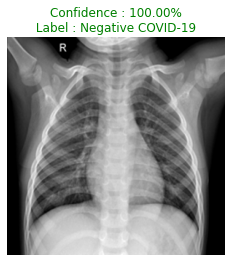



probability:[1.0927813e-07 9.9999988e-01]


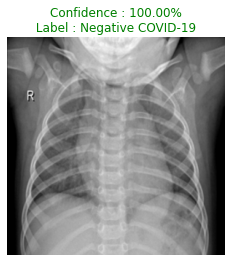



probability:[0.3724765 0.6275235]


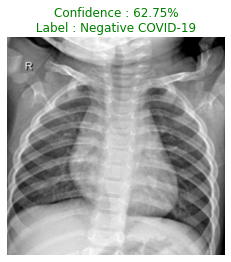



probability:[5.054389e-14 1.000000e+00]


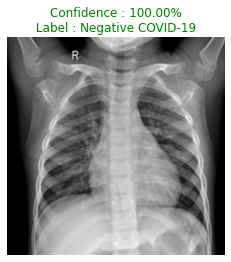



probability:[2.5029297e-14 1.0000000e+00]


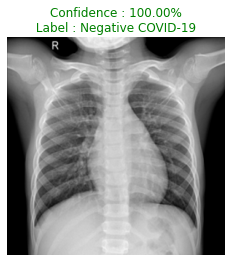



probability:[1.7348826e-11 1.0000000e+00]


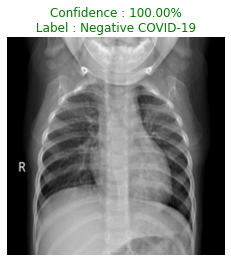



probability:[1.9945687e-11 1.0000000e+00]


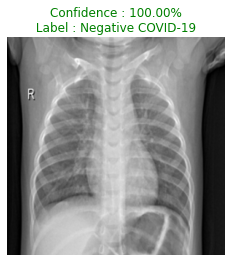



probability:[5.2313026e-13 1.0000000e+00]


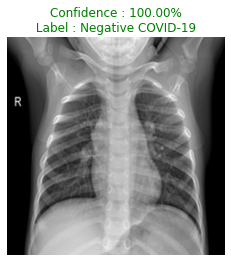



probability:[4.9988685e-10 1.0000000e+00]


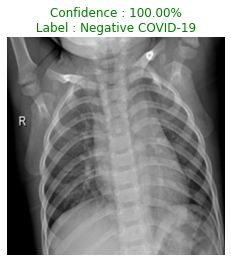

In [16]:
print("Predictions finished")
print("Output Predictions From Data Testing : ")
import cv2
import matplotlib.image as mpimg
try:
    for index, probability in enumerate (preds):
        image_path = testing_base_dir + "/" +test_generator.filenames[index]
        image = mpimg.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.axis('off')
        plt.imshow(image)

        print("\n\n============================================")
        
        negative_color = 'green'
        positive_color = 'red'

        if probability[1] > 0.5:
          plt.title('Confidence : '+ '%.2f' % (probability[1]*100) +'%'+ '\n Label : Negative COVID-19 ',color=negative_color)
        else:
          plt.title('Confidence : '+ '%.2f' % ((1-probability[1])*100) +'%'+ '\n Label : Positive COVID-19',color=positive_color)

        print("probability:{}".format(probability))
        print("============================================")
        plt.show()
        print("============================================")
except IndexError:
    pass